# Pascal

$\textbf{Data Source}$: 
Pascal Dataset (VOC 2007 Version). <br>
For information about the Pascal dataset see http://host.robots.ox.ac.uk/pascal/VOC/ <br>
Easiest (and most reliable) download is from the mirror https://pjreddie.com/projects/pascal-voc-dataset-mirror/ <br>
JSON annotation files for bounding box object detection task in same format as for COCO dataset can be found at http://cocodataset.org/#external 

$\textbf{Data Preparation}$: To run this Jupyter Notebook do the following steps:
1. Download the VOC 2007 Train/Validation Data (439 MB) from the mirror. Then place the downloaded 'VOC2007' folder in the 'Pascal' directory of your cloned version of the NeuralNetworkLibrary repository.
2. Download the JSON annotations from source above, and place the downloaded 'PASCAL_VOC' folder in the 'Pascal' directory of your cloned version of the NeuralNetworkLibrary repository.

$\textbf{Other Preparation}$: This Jupyter Notebook uses the pre-trained model 'RetinanetPretrainedCOCO.pt' in the 'Applications/VisionModels' directory of the NeuralNetworkLibrary repository. This model was stored on GitHub using git large file storage (https://git-lfs.github.com), and will not automatically be copied correctly when cloning the repository. To fix this, go to the original GitHub repository, click on the 'RetinanetPretrainedCOCO.pt' file, and download it individually. Then move it to your cloned version of the repository.

$\textbf{Objective}$:
Bounding Box Object Detection. There are 20 different possible classes of objects which may be contained in the images such as 'person', 'cat', and 'tvmonitor'. In each image, the goal is to draw bounding boxes around any objects of any of these classes. 

In [1]:
# Automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Imports
import sys
sys.path.append("../")
from Applications.Vision import *

### Data

In [2]:
PATH = 'Pascal'
train_name = 'VOC2007/JPEGImages'
train_json = 'PASCAL_VOC/pascal_train2007.json'
val_name = 'VOC2007/JPEGImages'
val_json = 'PASCAL_VOC/pascal_val2007.json'
transforms = get_transforms_bbox('SideOn')
bs = 2

data = ImageDataObj.from_json_bbox(PATH, transforms, bs, train_json=train_json, val_json=val_json,
                                   train_name=train_name, val_name=val_name)

getting train images



getting val images


### Loss Function, Model, and Learner

Our loss function for training is a form of single-shot-detection loss (SSD loss), which combines a smooth L1 loss function for regression of the bounding box coordinates and a focal loss function for classification of boxes. The ObjectDetectionNet itself is an implementation of the RetinaNet model. The paper introducing both the RetinatNet model and focal loss function is:

"Focal Loss for Dense Object Detection" https://arxiv.org/pdf/1708.02002.pdf

In [3]:
loss_func = SSD_loss(beta=0.5)
model = ObjectDetectionNet(num_classes=20, drop=[0.25,0.0])
learner = ImageLearner(PATH,data,model,optimizer='Adam',loss_func=loss_func)

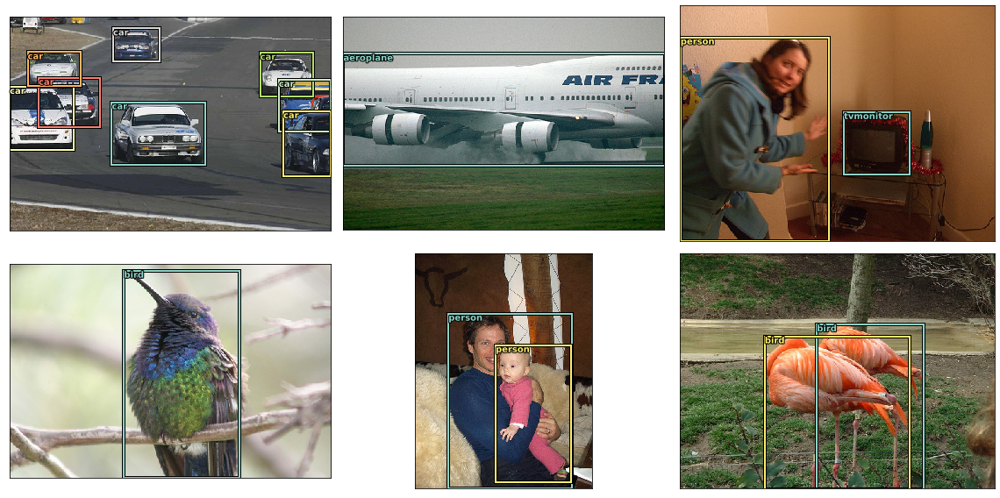

In [4]:
# Look at some random train images with their ground truth bounding boxes
learner.show_images('train')

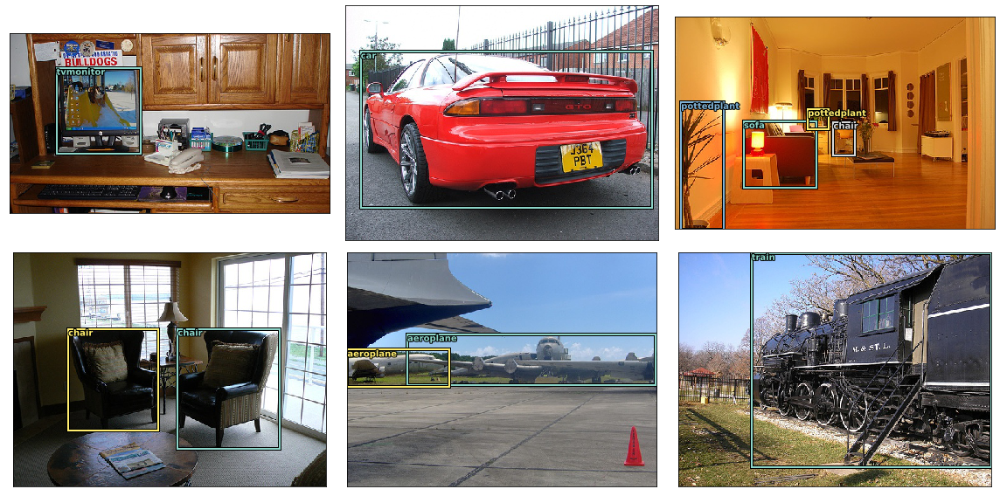

In [5]:
# Look at some random validation images with their ground truth bounding boxes
learner.show_images('val')

Now, we evaluate the model to check a few things prior to training.

First we want to make sure the SSD Regression Loss and SSD Classification Loss are reasonably balanced. Otherwise, we will want to use a different value of beta than 0.5 as the weighting in the SSD_Loss function. Also, we use the ComputeMaxOverlaps metric to evaluate the max jaccard overlaps of each ground truth bounding box with any anchor box. 

In [6]:
RegLoss = SSD_RegLoss(learner.loss_func)
ClasLoss = SSD_ClasLoss(learner.loss_func)
CMO = ComputeMaxOverlaps()

loss, metrics = learner.evaluate('val',metrics=[RegLoss,ClasLoss,CMO])
reg_loss, clas_loss, cmo = metrics[0], metrics[1], metrics[2]

print('SSD Loss:', loss)
print('SSD Regression Loss:', reg_loss)
print('SSD Classification Loss:', clas_loss)
print('ComputeMaxOverlaps Score:', cmo)


SSD Loss: 1.107188732928014
SSD Regression Loss: 1.0466049651463194
SSD Classification Loss: 1.167772504105511
ComputeMaxOverlaps Score: 0.7565461000538917


So, fortunately, we see that the SSD Regression Loss and SSD Classification Loss are fairly well balanced.

In training, we declare an anchor box to 'match' with a ground truth bounding box if the 2 boxes have jaccard overlap > 0.5. Thus, we would like it to be the case that almost all ground truth boxes have somewhat greater than 0.5 overlap with some anchor box. This is indeed the case, as shown in the histogram plot below. (NOTE: The value of the ComputeMaxOverlaps metric 0.756 is the mean over ground truth bounding boxes of the max overlap of each bounding box with any anchor box.)

Text(0, 0.5, 'frequency')

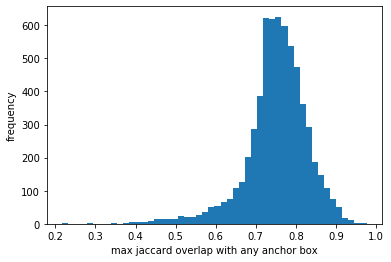

In [7]:
bins = plt.hist(CMO.max_overlaps,bins=50)
plt.xlabel('max jaccard overlap with any anchor box')
plt.ylabel('frequency')

### Training

First we train for a few epochs with learner.freeze() mode. 

For the ObjectDetectionNet this means that both the resnet50 backbone and the feature-pyramid-network components of the retinanet model are frozen. Only the classifier and regressor components have their weights updated during training. These components take in the spatial features output by the feature-pyramid-network at various scales, and create from them the predicted bounding box locations and predicted classes for each pre-set anchor box at each of these scales.

In [8]:
learner.freeze()
learner.bn_freeze()

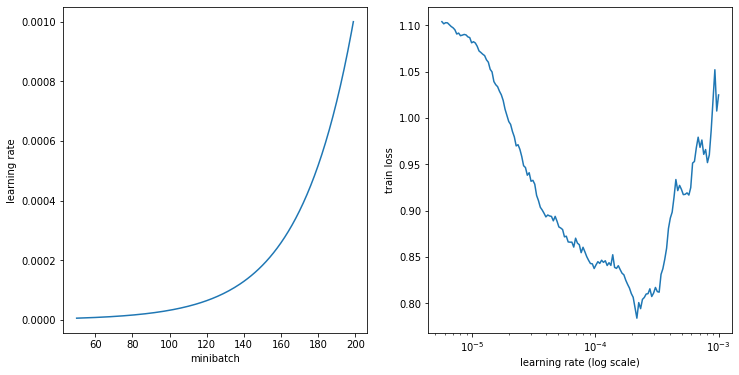

In [9]:
learner.find_lr(lr_min=1e-6,lr_max=1e-3,length=200,smoothing_radius=10,plot_start_batch=50)

In [10]:
lr = 3e-5
learner.fit(lr,3,metrics=[RegLoss,ClasLoss])

epoch   train_loss  val_loss    metrics     

0       0.38945     0.38682     0.44005     0.33359       epoch run time: 6 min, 2.82 sec
1       0.35990     0.33446     0.40497     0.26394       epoch run time: 6 min, 4.42 sec
2       0.31076     0.31978     0.39777     0.24178       epoch run time: 6 min, 7.09 sec


Now, we unfreeze all layers and train with the 1-cycle method for a longer period.

In [11]:
learner.unfreeze()
learner.bn_freeze()

lr_max = [1e-6,1e-5,1e-4]
learner.fit_one_cycle(lr_max, 10, metrics=[RegLoss,ClasLoss])

epoch   train_loss  val_loss    metrics     

0       0.31228     0.32073     0.38485     0.25661       epoch run time: 7 min, 59.45 sec
1       0.32267     0.32342     0.38330     0.26354       epoch run time: 8 min, 3.30 sec
2       0.33706     0.31964     0.37827     0.26100       epoch run time: 8 min, 3.28 sec
3       0.29343     0.30142     0.37000     0.23284       epoch run time: 7 min, 59.33 sec
4       0.26676     0.28755     0.34859     0.22651       epoch run time: 7 min, 55.77 sec
5       0.23671     0.28394     0.33691     0.23097       epoch run time: 8 min, 5.33 sec
6       0.22797     0.27086     0.31809     0.22363       epoch run time: 8 min, 3.75 sec
7       0.19508     0.25708     0.31350     0.20066       epoch run time: 7 min, 58.31 sec
8       0.18584     0.24977     0.30699     0.19255       epoch run time: 8 min, 1.58 sec
9       0.18449     0.24968     0.30688     0.19248       epoch run time: 8 min, 1.90 sec


In [12]:
learner.save('10Epoch1cycle')
learner.load('10Epoch1cycle')
learner.evaluate('val',metrics=[RegLoss,ClasLoss])

[0.24968130847817635, array([0.30687913, 0.19248349])]

### Prediction

#### Show bounding box predictions for sample images

In [13]:
# dup_pairs and inc_classes
dup_pairs = [(i,j) for i in range(20) for j in range(20) if i!=j]
inc_classes = []

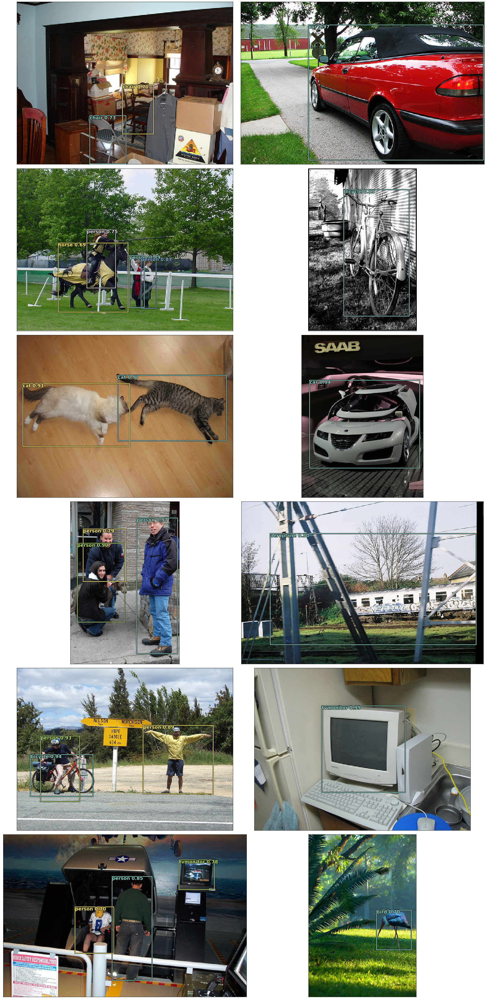

In [15]:
# Bounding box predictions shown for first 12 images in validation set
learner.show_bbox_preds('val', thresh=0.3, max_overlap=0.4, rel_thresh=[0.5,0.7], top_k=1000, 
                        max_boxes=20, dup=[0.8,dup_pairs], inc=[0.8,inc_classes], 
                        random=False, num_images=12, num_cols=2)

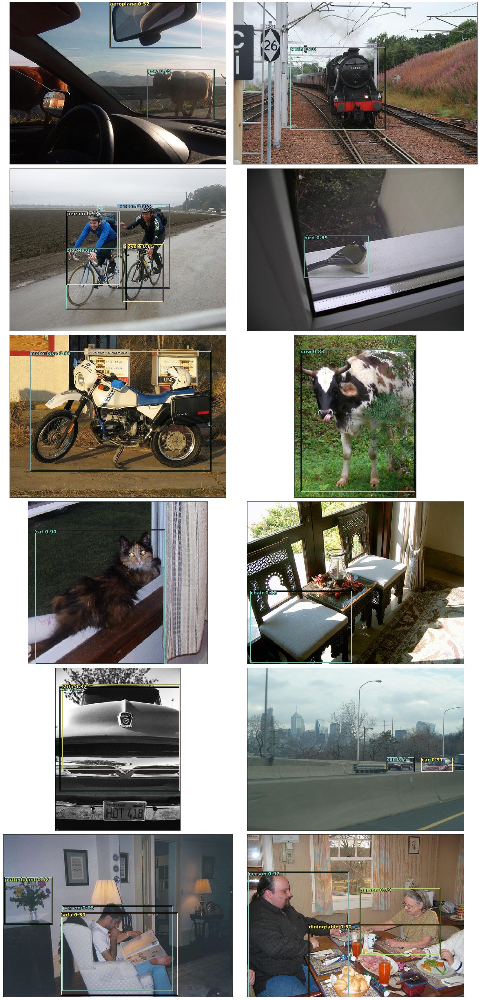

In [16]:
# Bounding box predictions shown for 12 random images in validation set
learner.show_bbox_preds('val', thresh=0.3, max_overlap=0.4, rel_thresh=[0.5,0.7], top_k=1000, 
                        max_boxes=20, dup=[0.8,dup_pairs], inc=[0.8,inc_classes], 
                        random=True, num_images=12, num_cols=2)

NOTE: The numbers in each predicted bounding box represent a confidence score, in range [0,1], that predicted box is really an object of predicted class.

#### Compute mAP score for predictions on entire validation set

The mean average precision (or mAP) score, averaged over all object classes, is the standard metric used
for evaluating bounding box datasets. It may be computed at various Jaccard (or IoU) thresholds. For example, if the threshold is 0.5, a predicted bounding box is said to be a correct prediction of a ground truth bounding box if the two boxes have a Jaccard overlap > 0.5 and the predicted class is the same as the ground truth class. A good explanation of the mAP metric is available at:

https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173

For the Pascal dataset traditionally a threshold of 0.5 was used. For the COCO dataset, which is much larger, the standard is the average score over a range of thresholds [0.5, 0.55, 0.6, ..., 0.95]. The evaluation function below, learner.coco_pascal_eval(), uses the pycocotools code from the COCO evaluation server, which works for any dataset with JSON annotaions in the same format as COCO. The output is a result at many combinations of thresholds, and also for different box sizes.

In [17]:
val_json = 'Pascal/PASCAL_VOC/pascal_val2007.json'
learner.coco_pascal_eval(val_json, predictions=None, thresh=0.05, max_overlap=0.4, rel_thresh=None, 
                         top_k=1000, max_boxes=20, dup=None, inc=None)

loading annotations into memory...
Done (t=0.13s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.25s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.43s).
Accumulating evaluation results...
DONE (t=1.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.546
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.823
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.605
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.243
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.431
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.594
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.463
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.638
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

To improve the mAP score a bit we can also use test time augmentation. 

In [18]:
preds_TTA = learner.TTA_bbox('val', transforms, thresh=0.05, max_overlap=0.4, rel_thresh=None, 
                             top_k=1000, max_boxes=20, dup=None, inc=None)

In [19]:
val_json = 'Pascal/PASCAL_VOC/pascal_val2007.json'
learner.coco_pascal_eval(val_json, predictions=preds_TTA)

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.51s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=7.32s).
Accumulating evaluation results...
DONE (t=1.59s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.561
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.836
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.617
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.233
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.450
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.610
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.476
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.654
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

The most important standard reference numbers here are the first two results: 

1. Value of 0.561 for average precision with [0.5,...,0.95] COCO thresholds and all box sizes (areas). 
2. Value of 0.836 for average precision with 0.5 Pascal threshold and all box sizes (areas).

NOTE:

In making our predictions for mAP evaluation, we have used the following changes relative to the parameters used above to display predicted boxes visually: 
1. Lower value of the threshold parameter $\textbf{thresh}$, for removing box predictions with low confidence scores.
2. No relative thresholding with the $\textbf{rel_thresh}$ parameter.
3. No additional filtering with $\textbf{dup}$ and $\textbf{inc}$ parameters.

The net effect of all this is that less of the initially predicted boxes are filtered out as 'bad predictions' when determining our final set of predicted boxes. This gives a somewhat better result for the mAP score, which is why it was done. However, visually filtering out more of the boxes leads to nicer predictions, which is why different parameters were used for displaying predictions above visually. Basically, there are less false or misplaced predicted boxes when you do the additional filtering, but also some more of the true boxes are missed. 

On the 'visual metric' it is better to miss boxes that should be there (especially of small or distant objects), but make sure you don't have too many false positives, which create a messy and confusing picture. However, for the mAP metric it is better to make relatively more predictions even if some of them are wrong -- as long as you don't miss so many real boxes, and as long as the incorrect predictions have lower confidence scores. Part of the reason for this is that with the standard mAP metric (for all box sizes), missing a small distant object in your predictions is weighted just as heavily as missing a large central object, which is totally out of line with the 'visual metric'. 